# Анализ рынка заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

Файл `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

## Ход проекта

- Шаг 1. Загрузка данных и изучение общей информации
- Шаг 2. Подготовка данных
- Шаг 3. Изучение и проверка данные
- Шаг 4. Изучение воронки событий
- Шаг 5. Изучение результатов эксперимента

In [1]:
import pandas as pd
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 500)
pd.set_option('max_colwidth', 1000)
pd.set_option('display.expand_frame_repr', False)

# убираю scientific notation
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns

import numpy as np
from scipy.stats import ttest_ind

import os

import json

import folium
# импортируем карту и маркер
from folium import Map, Marker

# импортируем карту и хороплет
from folium import Map, Choropleth

# импортируем кластер
from folium.plugins import MarkerCluster

# импортируем собственные иконки
from folium.features import CustomIcon

## Шаг 1. Загрузка данные. Изучение общей информации

In [2]:
# загрузим данные
if os.path.exists(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\moscow_places.csv'):
    df = pd.read_csv(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\moscow_places.csv')
elif os.path.exists(r'/datasets/moscow_places.csv'):
    df = pd.read_csv('/datasets/moscow_places.csv')
else:
    print('Ошибка в пути файла')

In [3]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,NaN,0,4.000
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,NaN,0,45.000
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.882,37.489,5.000,NaN,Цена чашки капучино:155–185 ₽,NaN,170.000,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881,37.449,5.000,средние,Средний счёт:400–600 ₽,500.000,NaN,1,148.000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датасете 8406 записей. 

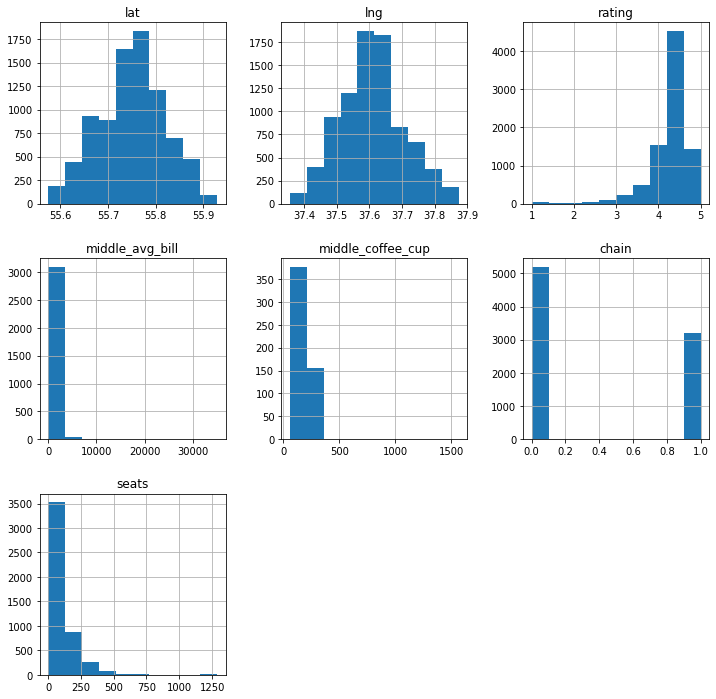

In [5]:
df.hist(figsize=(12,12))
plt.show()

Здесь мы видим распределение основных величин:

- Большинство заведений имеют рейтинг не ниже 4 звезд
- Средний чек чаще всего составляет примерно 1000 рублей
- Средняя стоимость чашки кофе - чаще всего не превышает 250 руб
- Не сетевых заведений больше, чем сетевых
- Большинство заведений имеют примерно 125 посадочных мест

## Шаг 2. Предобработка данных

Начнем с проверки форматов данных

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Все форматы данных указаны верно

### Проверка на пропуски

Проверим данные на наличие пропусков и отобразим их число в процентах.

In [7]:
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Здесь мы видим, что больше всего пропусков в столбце middle_coffee_cup, в нем содержатся данные о средней стоимости чашки кофе. Также много пропусков в столбцах `price`, `avg_bill`, `middle_avg_bill`.

Учитывая высокую долю пропусков, строчки с пропусками не получится просто удалить. Предлагаю попробовать заполнить пропуски медианными или средними значениями, и посмотреть, как это повлияет на распределение для каждого столбца.

### Проверка на полные и неявные дуликаты

In [8]:
print('Количество полных дубликатов', df.duplicated().sum())
print('Доля полных дубликатов', df.duplicated().sum() / len(df))

Количество полных дубликатов 0
Доля полных дубликатов 0.0


В датасете нет строк, полностью дублирующих другие.

Теперь посмотрим на неявные дубликаты

In [9]:
sorted(df['category'].unique())

['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

In [10]:
sorted(df['district'].unique())

['Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ']

In [11]:
# код ревьюера

df.duplicated(subset=['name', 'address']).sum()

0

В датасете нет неявных дубликатов

### Добавление столбцов

#### Столбец street с названиями улиц из столбца с адресом

Посмотрим, как записаны адреса в столбце `address`.

Мы видим, что адрес записано в следующей структуре:
- город
- улица
- номер дома

Теперь извлечем названия улиц из столбца `address` 

In [12]:
df['street_name'] = df['address'].str.split(pat = ', ').str[1]

In [13]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,NaN,0,4.000,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,NaN,0,45.000,Клязьминская улица


#### Столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

Добавим столбец с обозначением, работает ли заведение круглосуточно:
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

Сначала посмотрим на то, как указаны часы работы в датасете. Выведем уникальные значения столбца `hours`

In [14]:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

Мы видим, что данные о часах работы хранятся в следующей структуре:
- дни недели
- часы работы в вышеуказанные дни

Получается, что нам нужно отметить значением True те заведения, у которых в столбце `hours` указано: **'ежедневно, круглосуточно'**. Выберем такие заведения и создадим столбец `'is_24/7'`

In [15]:
df['is_24/7'] = np.where(df['hours']== 'ежедневно, круглосуточно', True, False)

Проверим новый столбец

In [16]:
df[df['hours'] == 'ежедневно, круглосуточно'].head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.878,37.469,4.500,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.000,Левобережная улица,True
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.877,37.450,4.400,средние,Средний счёт:350–500 ₽,425.000,NaN,0,96.000,Ленинградское шоссе,True
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.888,37.516,4.400,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True


## Шаг 3. Анализ данных

### Анализ категорий заведений

Посмотрим, какие категории заведений представлены в датасете и в каком соотношении

In [17]:
category_pivot = (
    df
    .pivot_table(
        index='category', 
        values='name', 
        aggfunc='count'
    )
    .sort_values(
        by='name', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(category_pivot)

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


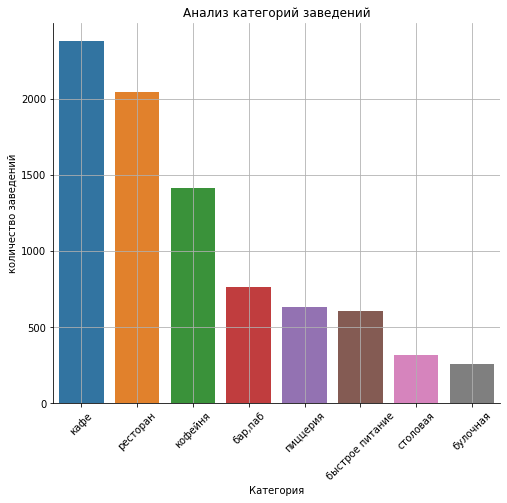

In [18]:
f, ax = plt.subplots(figsize = (8, 7))
ax = sns.barplot(x = category_pivot['category'], y = 'name', \
                 data = category_pivot.sort_values('name', ascending = False), \
                 orient = 'v')
plt.title('Анализ категорий заведений')
plt.xticks(rotation=45)
ax.set_xlabel('Категория') 
ax.set_ylabel('количество заведений')
plt.grid()
sns.despine()
plt.show()

Можно выделить ТОП 3 категорий заведений:
- кафе
- ресторан
- кофейня

Остальные заведения сильно отстают по количеству, реже всего в столице встречаются булочные.

### Анализ количества посадочных мест в заведениях по категориям

Посмотрим на количество посадочных мест в ресторанах по категориям

In [19]:
seats_pivot = (
    df
    .pivot_table(
        index='category', 
        values='seats', 
        aggfunc='median'
    )
    .sort_values(
        by='seats', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(seats_pivot)

,category,seats
0,ресторан,86.000
1,"бар,паб",82.500
2,кофейня,80.000
3,столовая,75.500
4,быстрое питание,65.000
5,кафе,60.000
6,пиццерия,55.000
7,булочная,50.000


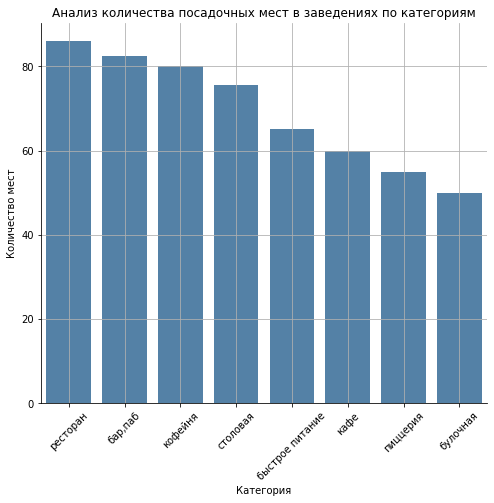

In [20]:
# отсортируем данные в переменной, чтобы получить более наглядный график
#seats_pivot = seats_pivot.sort_values('seats', ascending = False)

# построим график с помощью библиотеки seaborn
f, ax = plt.subplots(figsize = (8, 7))
ax = sns.barplot(x = seats_pivot['category'], y = 'seats', \
                 data = seats_pivot.sort_values('seats', ascending = False), \
                 orient = 'v', color='steelblue')
plt.title('Анализ количества посадочных мест в заведениях по категориям')
plt.xticks(rotation=45)
ax.set_xlabel('Категория') 
ax.set_ylabel('Количество мест')
plt.grid()
sns.despine()
plt.show()

Мы видим, что медианное количество мест в ресторанах, барах, пабах и кофейнях примерно одинаковое, и находится в диапазоне от 86 (для ресторанов) до 80 (для кофеен).

Наименее вместительными оказались булочные, для них медианное значение посадочных мест составляет 50 мест.

Посмотрим на распределение посадочных мест для кофеен по районам

In [21]:
cafe_seats_pivot = (
    df[df['category'] == 'кофейня']
    .pivot_table(
        index='district', 
        values='seats', 
        aggfunc='median'
    )
    .sort_values(
        by='seats', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(cafe_seats_pivot)

,district,seats
0,Западный административный округ,96.000
1,Северо-Западный административный округ,87.500
2,Центральный административный округ,86.000
3,Южный административный округ,80.000
4,Северо-Восточный административный округ,75.000
5,Северный административный округ,66.000
6,Юго-Западный административный округ,64.500
7,Восточный административный округ,55.000
8,Юго-Восточный административный округ,50.000


Мы видим, что число посадочных мест отличается от района к району. Так, наиболее вместительные кофейни находятся в центральном округе.

### Соотношение сетевых и несетевых заведений в датасете

In [22]:
chain_pivot = (
    df 
    .pivot_table(
        index='chain', 
        values='name', 
        aggfunc='count'
    )
    .sort_values(
        by='name', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(chain_pivot)

,chain,name
0,0,5201
1,1,3205


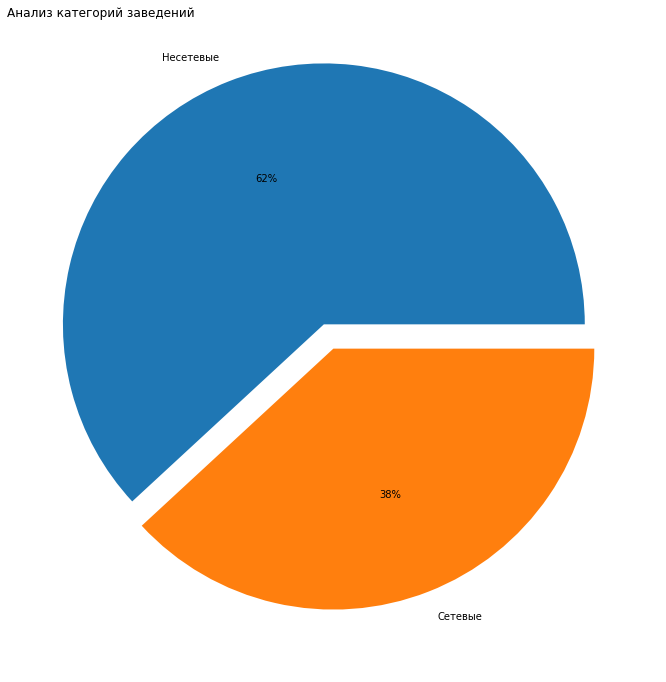

In [23]:
f, ax = plt.subplots(figsize = (12, 12))

# declaring exploding pie
explode = [0.1, 0]

# define Seaborn color palette to use
colors = sns.color_palette('tab10')

plt.title('Анализ категорий заведений', loc='left')
my_labels = ['Несетевые', 'Сетевые']
  
# plotting data on chart
plt.pie(chain_pivot['name'], labels = my_labels, colors=colors, explode = explode, autopct='%.0f%%')
  
# displaying chart
plt.show()

Мы видим, что несетевых заведений гораздо больше, чем сетевых

### Какие категории заведений чаще являются сетевыми?

In [24]:
chain_by_category_pivot = (
    df
    .pivot_table(
        index='category', 
        values='chain', 
        aggfunc='sum'
    )
    .sort_values(
        by='chain', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(chain_by_category_pivot)

,category,chain
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


Здесь мы видим, что чаще всего сетевыми заведениями являются:
- кафе
- рестораны
- кофейни

Для кафе и ресторанов число сетевых заведений составляет примерно одинаковую долю.

Можем также посчитать долю сетевых заведений относительно общего количества заведений в категории

In [25]:
# соединим таблицу chain_by_category_pivot и category_pivot
chain_by_category_pivot = chain_by_category_pivot.merge(category_pivot, on='category', how='left', suffixes=('_x', '_y'))

chain_by_category_pivot['ratio'] = chain_by_category_pivot['chain'] / chain_by_category_pivot['name']

chain_by_category_pivot = chain_by_category_pivot.sort_values(
                                by='ratio', 
                                ascending=False
)

Посмотрим на распределение сетевых и несетевых заведений по категориям

In [26]:
chain_by_category_pivot

,category,chain,name,ratio
6,булочная,157,256,0.613
3,пиццерия,330,633,0.521
2,кофейня,720,1413,0.510
4,быстрое питание,232,603,0.385
1,ресторан,730,2043,0.357
0,кафе,779,2378,0.328
7,столовая,88,315,0.279
5,"бар,паб",169,765,0.221


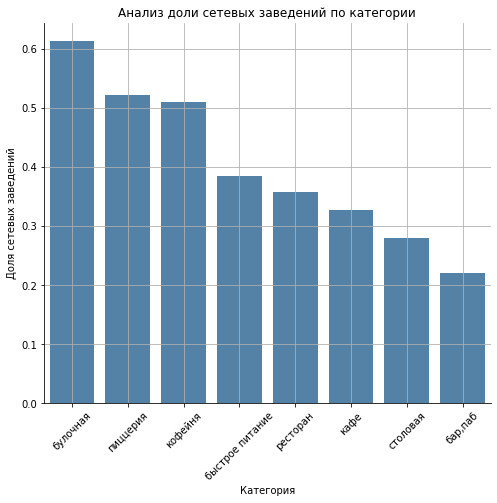

In [27]:
f, ax = plt.subplots(figsize = (8, 7))
ax = sns.barplot(x = chain_by_category_pivot['category'], y = 'ratio', \
                 data = chain_by_category_pivot.sort_values('ratio', ascending = False),\
                 orient = 'v', color='steelblue')
plt.title('Анализ доли сетевых заведений по категории')
plt.xticks(rotation=45)
ax.set_xlabel('Категория') 
ax.set_ylabel('Доля сетевых заведений')
plt.grid()
sns.despine()
plt.show()

Наибольшую долю сетевые заведения составляют в следующих категориях:
- булочная
- пиццерия
- кофейня

Необычно, что для заведений из категории 'быстрое питание' доля сетевых составляет лишь 0.38

### ТОП-15 популярных сетей в Москве. 

Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [28]:
# выделим только сетевые заведения
is_chain = df[df['chain'] == 1]

#display(is_chain)

In [29]:
top_chain_pivot = (
    is_chain
    .pivot_table(
        index='name', 
        values='address', 
        aggfunc='count'
    )
    .sort_values(
        by='address', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index().head(15))

display(top_chain_pivot)

,name,address
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


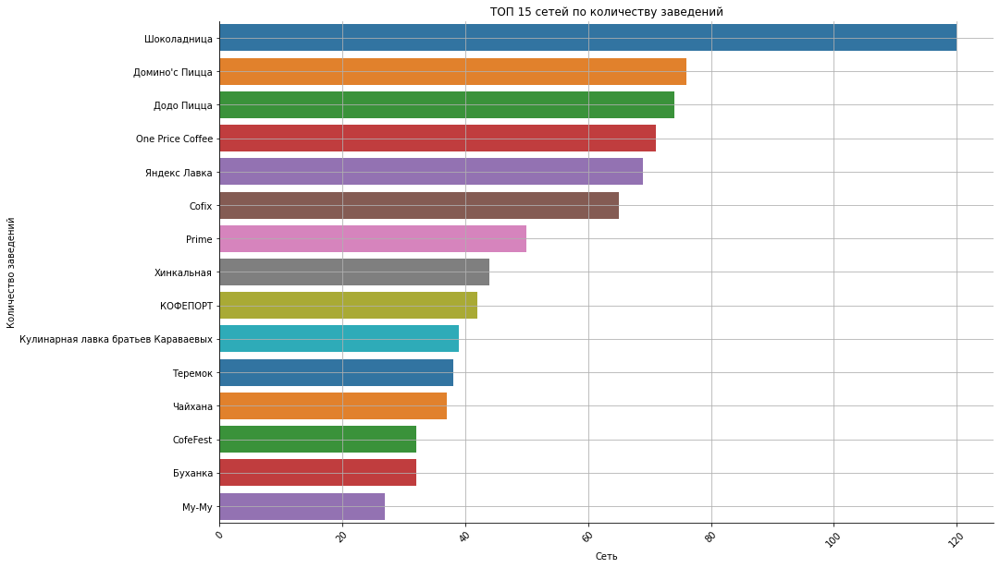

In [30]:
f, ax = plt.subplots(figsize = (15, 10))
ax = sns.barplot(x = 'address', y = 'name', \
                 data = top_chain_pivot.sort_values('address', ascending = False), \
                 orient = 'h', palette = 'tab10')
plt.title('ТОП 15 сетей по количеству заведений')
ax.set_xlabel('Сеть') 
ax.set_ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.grid()
sns.despine()
plt.show()

Больше всего заведений в сети Шоколадница.

Затем мы видим заметый спад в количестве.

Отфильтруем наш датафрейм так, чтобы оставить там только заведения из ТОП-15 сетей

In [31]:
# создадим список из названия ТОП сетей
top_chain_list = list(top_chain_pivot['name'])

# теперь создадим датафрейм с заведениями из этих сетей
top_chain_df =  df[df['name'].isin(top_chain_list)]

top_chain_df.sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
5700,Буханка,булочная,"Москва, Гжатская улица, 5, корп. 1",Западный административный округ,"ежедневно, 08:00–22:00",55.715,37.436,4.400,NaN,NaN,NaN,NaN,1,NaN,Гжатская улица,False
2246,Шоколадница,кофейня,"Москва, проспект Мира, 112",Северо-Восточный административный округ,"пн-пт 08:00–23:00; сб,вс 09:00–23:00",55.807,37.638,4.100,NaN,NaN,NaN,NaN,1,150.000,проспект Мира,False
1495,Теремок,ресторан,"Москва, Волоколамское шоссе, 26",Северный административный округ,пн-сб 08:30–18:30,55.810,37.499,4.000,NaN,NaN,NaN,NaN,1,NaN,Волоколамское шоссе,False


Теперь посмотрим, как соотносятся категории

In [32]:
top_chain_category_pivot = (
    top_chain_df
    .pivot_table(
        index='category', 
        values='name', 
        aggfunc='count'
    )
    .sort_values(
        by='name', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(top_chain_category_pivot)

,category,name
0,кофейня,336
1,ресторан,186
2,пиццерия,151
3,кафе,100
4,булочная,25
5,быстрое питание,12
6,"бар,паб",4
7,столовая,2


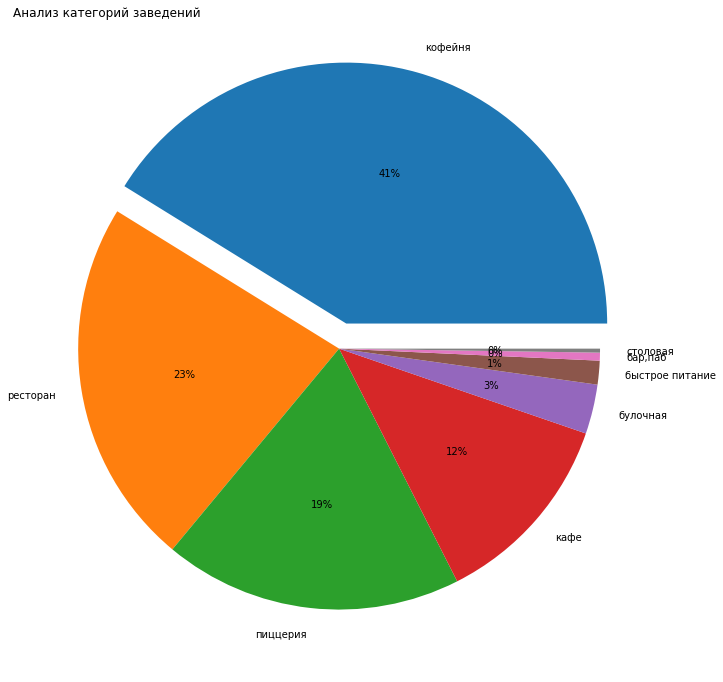

In [33]:
f, ax = plt.subplots(figsize = (12, 12))

# declaring exploding pie
explode = [0.1, 0, 0, 0, 0, 0, 0, 0]
# define Seaborn color palette to use
colors = sns.color_palette('tab10')

plt.title('Анализ категорий заведений', loc='left')
  
# plotting data on chart
plt.pie(top_chain_category_pivot['name'], 
        labels=top_chain_category_pivot['category'], 
        colors=colors, 
        explode = explode, 
        autopct='%.0f%%')
  
# displaying chart
plt.show()

Большенство заведений из ТОП 15 сетей - кофейни (41%)

Далее следуют рестораны (23%) и пиццерии (19%)

Остальные категории составляют намного меньшую долю

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Да, все так
</div>

### Анализ заведений по административным районам Москвы? 

Отобразите общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию одним графиком.

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
dtype: int64

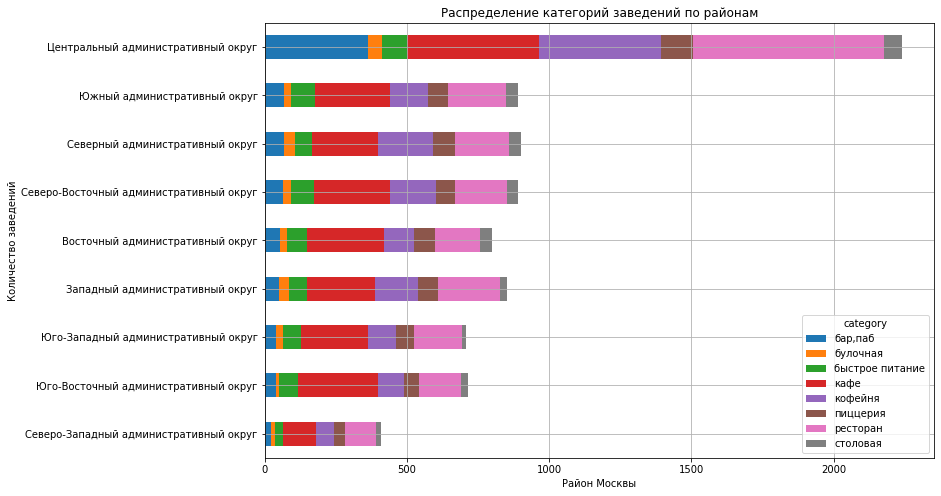

In [34]:
district_plot_pivot = df.pivot_table(
index = 'category',
columns = 'district',
values = 'name',
aggfunc = 'count'
)

# отсортируем значения и сложим их по районам
sorting = district_plot_pivot.sum().sort_values(ascending = False)

# отобразим таблицу с суммой заведений по районам
display(sorting)

# построим график
district_plot_pivot.T.sort_values(by='бар,паб').plot.barh(stacked = True, figsize = (12,8))

plt.title('Распределение категорий заведений по районам')
plt.xlabel('Район Москвы') 
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

На графике видно, что больше всего заведений расположено в центральном административном округе.
Если говорить о категориях, то во всех районах города можно выделить три лидирующие категории (т.е. те, которые встречаются чаще всего):
- Ресторан
- Кафе
- Кофейня

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [35]:
rating_pivot = (
    is_chain
    .pivot_table(
        index='category', 
        values='rating', 
        aggfunc='mean'
    )
    .sort_values(
        by='rating', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index().head(15))

display(rating_pivot)

,category,rating
0,"бар,паб",4.391
1,булочная,4.286
2,пиццерия,4.283
3,столовая,4.237
4,ресторан,4.228
5,кофейня,4.207
6,кафе,4.199
7,быстрое питание,4.056


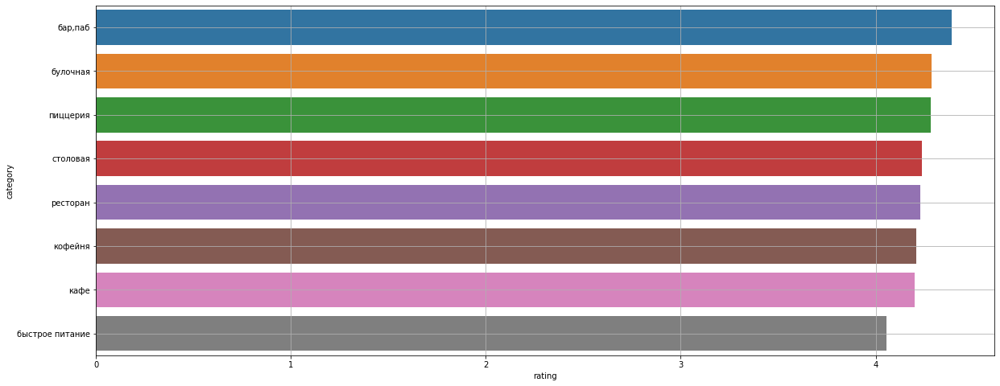

In [36]:
f, ax = plt.subplots(figsize = (20, 8))
sns.barplot(data=rating_pivot, y="category", x="rating", orient = 'h')
plt.grid()
plt.show()

### Картограмма

- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [37]:
# загружаем JSON-файл с границами округов Москвы
if os.path.exists(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'):
    with open(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson') as f:
        geo_json = json.load(f)
elif os.path.exists(r'/datasets/admin_level_geomap.geojson'):
    with open('/datasets/admin_level_geomap.geojson') as f:
        geo_json = json.load(f)
            
else:
    print('Ошибка в пути файла')

#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [38]:
# создадим датафрейм со средними рейтингами по районам Москвы
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df.head(3)

,district,rating
0,Восточный административный округ,4.174
1,Западный административный округ,4.182
2,Северный административный округ,4.240


In [39]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# загружаем JSON-файл с границами округов Москвы
#state_geo = r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'

if os.path.exists(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'):
    state_geo = r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\moscow_places.csv'
elif os.path.exists(r'/datasets/admin_level_geomap.geojson'):
    state_geo = r'/datasets/admin_level_geomap.geojson'
else:
    print('Ошибка в пути файла')
    
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

На карте мы видим деление на административные районы. Также мы отразили средний рейтинг для каждого района. Заведения с наибольшим рейтингом расположены в центральном округе.

Ниже всего средние рейтинги заведений в юго-восточном и северо-восточном административных округах.

Если говорить о плотности расположение заведений, то она увеличивается к центру города

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [40]:
street_name_pivot = (
    df.pivot_table(
        index='street_name', 
        values='name', 
        aggfunc='count'
    )
    .sort_values(
        by='name', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(street_name_pivot.head(15))

,street_name,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


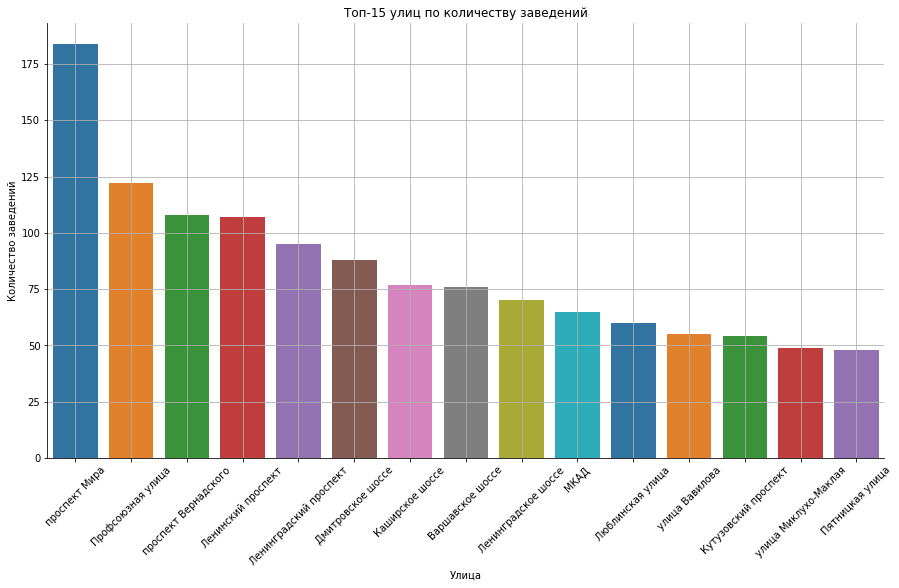

In [41]:
f, ax = plt.subplots(figsize = (15, 8))
ax = sns.barplot(x = 'street_name', y = 'name', \
                 data = street_name_pivot.sort_values('name', ascending = False).head(15), \
                 orient = 'v', palette = 'tab10')
plt.title('Топ-15 улиц по количеству заведений')
ax.set_xlabel('Улица') 
ax.set_ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.grid()
sns.despine()
plt.show()

Посмотрим, в каких районах расположены улицы из ТОП 15

In [42]:
# выделим названия ТОП 15 уиц в отдельный список
top_street_name_list = list(street_name_pivot['street_name'].head(15))

# создадим новый датафрейм содержащий только заведения на улицах из списка выше
top_street_df = df[df['street_name'].isin(top_street_name_list)]

top_street_df.sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
277,Pho' mos,быстрое питание,"Москва, МКАД, 87-й километр, 8",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899,37.630,4.000,NaN,NaN,NaN,NaN,0,NaN,МКАД,False
6532,I Need Doner,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 10:00–23:00",55.662,37.480,4.900,NaN,Средний счёт:400–700 ₽,550.000,NaN,1,NaN,проспект Вернадского,False
7004,One Price Coffee,кофейня,"Москва, улица Миклухо-Маклая, 36А",Юго-Западный административный округ,"ежедневно, 08:00–22:00",55.640,37.533,4.300,NaN,NaN,NaN,NaN,1,99.000,улица Миклухо-Маклая,False


In [43]:
top_street_df.pivot_table(
    index='district', 
    values='street_name', 
    aggfunc='nunique').sort_values(by='street_name', ascending=False).rename_axis(None, axis=1).reset_index()

,district,street_name
0,Юго-Западный административный округ,6
1,Южный административный округ,5
2,Западный административный округ,4
3,Северный административный округ,4
4,Северо-Восточный административный округ,3
5,Центральный административный округ,3
6,Юго-Восточный административный округ,2
7,Восточный административный округ,1
8,Северо-Западный административный округ,1


Большенство ТОП улиц находятся в Юго-Западный административный округе

Посмотрим на распределение категорий по ТОП улицам

street_name
проспект Мира            184.000
Профсоюзная улица        122.000
проспект Вернадского     108.000
Ленинский проспект       107.000
Ленинградский проспект    95.000
Дмитровское шоссе         88.000
Каширское шоссе           77.000
Варшавское шоссе          76.000
Ленинградское шоссе       70.000
МКАД                      65.000
Люблинская улица          60.000
улица Вавилова            55.000
Кутузовский проспект      54.000
улица Миклухо-Маклая      49.000
Пятницкая улица           48.000
dtype: float64

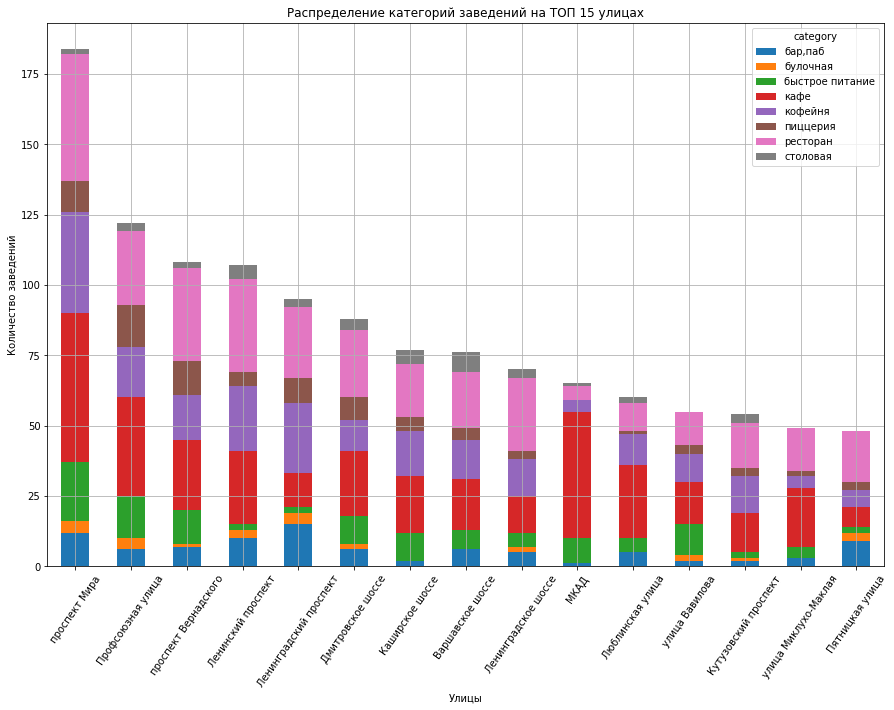

In [44]:
top_street_plot_pivot = top_street_df.pivot_table(
index = 'category',
columns = 'street_name',
values = 'name',
aggfunc = 'count'
)

# отсортируем значения и сложим их по районам
top_street_sorting = top_street_plot_pivot.sum().sort_values(ascending = False)

# отобразим таблицу с суммой заведений по районам
display(top_street_sorting)

# построим график
top_street_plot_pivot[top_street_sorting.index].T.plot.bar(stacked = True, figsize = (15,10))
plt.xticks(rotation=55)
plt.title('Распределение категорий заведений на ТОП 15 улицах')
plt.xlabel('Улицы') 
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

Проанализировав распределение категорий по ТОП улицам, мы видим, что основную часть категорий для каждой улицы составляют:
- Рестораны
- Кофейни
- Кафе

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

Сначала отсортируем датафрейм, чтобы видеть только улицы, на которых есть только одно заведение

In [45]:
single_place_streets_pivot = street_name_pivot[street_name_pivot['name'] == 1]
single_place_streets_pivot

,street_name,name
990,улица Фотиевой,1
991,улица Фадеева,1
992,улица Кирпичные Выемки,1
993,сад Эрмитаж,1
994,улица Ивана Франко,1
995,улица Капотня,1
996,улица Шухова,1
997,улица Ильинка,1
998,улица Юннатов,1
999,улица Академика Комарова,1


Сколько всего таких улиц в датасете?

In [46]:
len(street_name_pivot[street_name_pivot['name'] == 1])

458

Изучим информацию о заведениях на этих улицах.

In [47]:
# выделим названия улиц с одним заведением в список
single_place_streets_list = list(single_place_streets_pivot['street_name'])

single_place_streets =  df[df['street_name'].isin(single_place_streets_list)]

single_place_streets.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.886,37.493,4.100,средние,Средний счёт:300–500 ₽,400.000,NaN,0,180.000,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.877,37.465,4.500,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878,37.460,4.300,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False


In [48]:
len(single_place_streets)

458

Отобразим заведения на карте

In [49]:
single_place_streets_rating_df = single_place_streets.groupby('district', as_index=False)['rating'].agg('mean')

single_place_streets_rating_df.sort_values(by = 'rating', ascending = False)

,district,rating
5,Центральный административный округ,4.423
4,Северо-Западный административный округ,4.279
2,Северный административный округ,4.244
3,Северо-Восточный административный округ,4.158
7,Юго-Западный административный округ,4.150
0,Восточный административный округ,4.144
6,Юго-Восточный административный округ,4.118
8,Южный административный округ,4.091
1,Западный административный округ,4.049


In [50]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_single_place_streets = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# загружаем JSON-файл с границами округов Москвы
#state_geo = r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'

if os.path.exists(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'):
    state_geo = r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\moscow_places.csv'
elif os.path.exists(r'/datasets/admin_level_geomap.geojson'):
    state_geo = r'/datasets/admin_level_geomap.geojson'
else:
    print('Ошибка в пути файла')
    
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_single_place_streets)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=single_place_streets_rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m_single_place_streets)

# применяем функцию create_clusters() к каждой строке датафрейма
single_place_streets.apply(create_clusters, axis=1)

# выводим карту
m_single_place_streets

Посмотрим, в каких районах расположены ТОП 15 улиц

In [51]:
single_place_streets.pivot_table(index='district', 
                                 values='street_name', 
                                 aggfunc='nunique').sort_values(by='street_name',
                                                              ascending=False).rename_axis(
                                                                                            None, 
                                                                                            axis=1).reset_index().head(15)

,district,street_name
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


Посмотрим на распределение категорий

In [52]:
single_place_streets_category_pivot = (
    single_place_streets
    .pivot_table(
        index='category', 
        values='name', 
        aggfunc='count'
    )
    .sort_values(
        by='name', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

single_place_streets_category_pivot

,category,name
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Посмотрим на категории заведений

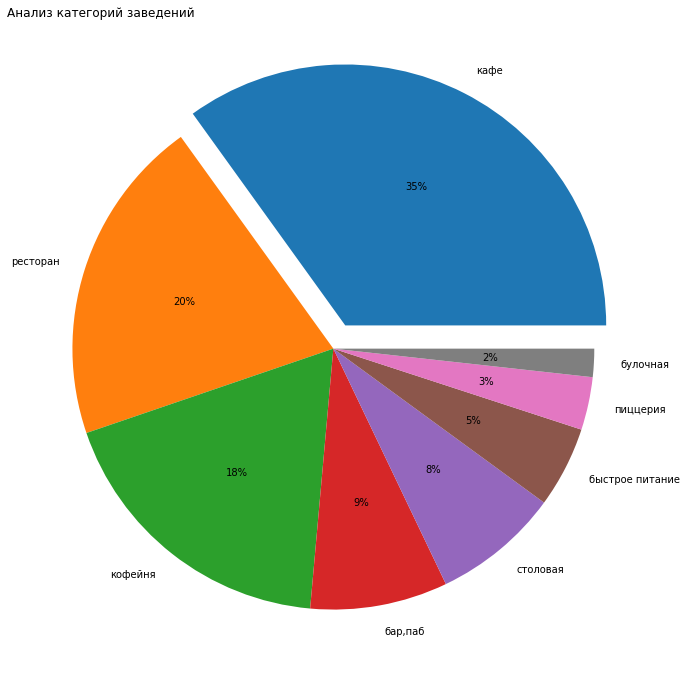

In [53]:
f, ax = plt.subplots(figsize = (12, 12))

# declaring exploding pie
explode = [0.1, 0, 0, 0, 0, 0, 0, 0]
# define Seaborn color palette to use
colors = sns.color_palette('tab10')

plt.title('Анализ категорий заведений', loc='left')
  
# plotting data on chart
plt.pie(single_place_streets_category_pivot['name'], 
        labels=single_place_streets_category_pivot['category'], 
        colors=colors, 
        explode = explode, autopct='%.0f%%')
  
# displaying chart
plt.show()

Распределение категорий такое же, как и у целого датасета

### Анализ средних чеков доя районов Москвы

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. 

Посчитайте медиану этого столбца для каждого района. 

Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [54]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,NaN,0,4.000,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,NaN,0,45.000,Клязьминская улица,False


In [55]:
df.pivot_table(
    index='district', 
    values='middle_avg_bill', 
    aggfunc='median'
).sort_values(
    by='middle_avg_bill', 
    ascending=False
).rename_axis(
    None, 
    axis=1
).reset_index()

,district,middle_avg_bill
0,Западный административный округ,1000.000
1,Центральный административный округ,1000.000
2,Северо-Западный административный округ,700.000
3,Северный административный округ,650.000
4,Юго-Западный административный округ,600.000
5,Восточный административный округ,575.000
6,Северо-Восточный административный округ,500.000
7,Южный административный округ,500.000
8,Юго-Восточный административный округ,450.000


### Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений

Изучим столбец с рейтингами

In [56]:
df['rating'].describe()

count   8406.000
mean       4.230
std        0.470
min        1.000
25%        4.100
50%        4.300
75%        4.400
max        5.000
Name: rating, dtype: float64

В качестве заведений с низким рейтингом возьмем те, у которых рейтинг ниже 4.1

In [57]:
low_rating = df[df['rating'] <= 4.1]
display(low_rating.head(3))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.886,37.493,4.100,средние,Средний счёт:300–500 ₽,400.000,NaN,0,180.000,улица Бусиновская Горка,False
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.880,37.482,4.000,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,True
27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.879,37.480,4.100,NaN,Средний счёт:от 240 ₽,240.000,NaN,0,4.000,улица Дыбенко,False


Изучим получившийся датасет, посмотрим на категории заведений, средние чеки

Изучим категории, представленные в датасете заведений с низкими рейтингами

In [58]:
low_rating_category_pivot = (
    low_rating
    .pivot_table(
        index='category', 
        values='name', 
        aggfunc='count'
    )
    .sort_values(
        by='name', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(low_rating_category_pivot)

,category,name
0,кафе,954
1,ресторан,435
2,кофейня,386
3,быстрое питание,278
4,пиццерия,133
5,столовая,103
6,"бар,паб",102
7,булочная,62


Как и в полном датасете, в ТОП 3 выходят:
- кафе
- рестораны
- кофейни

Можно сделать вывод, что нет очевидной зависимости между категорией и низким рейтингом

Посмотрим на средние чеки

In [59]:
low_rating['middle_avg_bill'].describe()

count     675.000
mean      676.536
std      1473.299
min        30.000
25%       300.000
50%       400.000
75%       700.000
max     35000.000
Name: middle_avg_bill, dtype: float64

Для сравнения выведем данные по средним чекам из полного датасета

In [60]:
df['middle_avg_bill'].describe()

count    3149.000
mean      958.054
std      1009.733
min         0.000
25%       375.000
50%       750.000
75%      1250.000
max     35000.000
Name: middle_avg_bill, dtype: float64

А также из датасета, где рейтинг заведений выше 4.4

In [61]:
df['middle_avg_bill'][df['rating'] > 4.4].describe()

count    751.000
mean    1308.960
std      997.053
min        0.000
25%      600.000
50%     1100.000
75%     1750.000
max     7250.000
Name: middle_avg_bill, dtype: float64

Между заведнеиями с низкими (4.1) и высокими (4.4) есть заметная разница в распределении значений средних чеков.

### Вывод

## Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [62]:
print('Всего кофеен в датасете:', len(df[df['category'] == 'кофейня']))

Всего кофеен в датасете: 1413


In [63]:
# создадим отдельный датафрем с кофейнями

cafe = df[df['category'] == 'кофейня']

cafe.sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
5128,Шоколадница,кофейня,"Москва, улица Сергия Радонежского, 29-31с1",Центральный административный округ,пн-чт 07:00–22:00; пт 07:00–23:00; сб 10:00–23:00; вс 10:00–22:00,55.747,37.680,4.200,NaN,Цена чашки капучино:239–274 ₽,NaN,256.000,1,NaN,улица Сергия Радонежского,False
5728,Шоколадница,кофейня,"Москва, улица Мичуринский Проспект, Олимпийская Деревня, 3к1",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.678,37.468,4.300,низкие,Цена чашки капучино:239–274 ₽,NaN,256.000,1,NaN,улица Мичуринский Проспект,False
2346,Артпирогъ,кофейня,"Москва, Большая Почтовая улица, 36, стр. 4",Центральный административный округ,"ежедневно, 08:30–20:30",55.781,37.697,4.300,средние,Средний счёт:200–400 ₽,300.000,NaN,0,NaN,Большая Почтовая улица,False


Посмотрим, как распределены кофейни по районам

In [64]:
cafe['district'].value_counts()

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

### Есть ли круглосуточные кофейни?

In [65]:
cafe[cafe['is_24/7'] == True].sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
3509,Кофемания,кофейня,"Москва, Кудринская площадь, 46/54с1",Центральный административный округ,"ежедневно, круглосуточно",55.758,37.585,4.400,высокие,Средний счёт:1500–2500 ₽,2000.000,NaN,1,NaN,Кудринская площадь,True
4734,Лаванда Кофе,кофейня,"Москва, Нижняя Красносельская улица, 35с48",Центральный административный округ,"ежедневно, круглосуточно",55.775,37.673,4.300,средние,Цена чашки капучино:189–269 ₽,NaN,229.000,0,NaN,Нижняя Красносельская улица,True
2516,Cofix,кофейня,"Москва, Комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.777,37.655,3.800,NaN,NaN,NaN,NaN,1,200.000,Комсомольская площадь,True


Посчитаем количество круглосуточных кофеен, а также посмотрим, в каких районах они находятся

In [66]:
print('Круглосуточных кофеен в датасете:', len(cafe[cafe['is_24/7'] == True]))

Круглосуточных кофеен в датасете: 59


### Какие у кофеен рейтинги? Как они распределяются по районам

In [67]:
cafe_rating_pivot = (
    cafe
    .pivot_table(
        index='district', 
        values='rating', 
        aggfunc='mean'
    )
    .sort_values(
        by='rating', 
        ascending=False
    )
    .rename_axis(
        None, 
        axis=1
    ).reset_index())

display(cafe_rating_pivot)

,district,rating
0,Центральный административный округ,4.336
1,Северо-Западный административный округ,4.326
2,Северный административный округ,4.292
3,Юго-Западный административный округ,4.283
4,Восточный административный округ,4.283
5,Южный административный округ,4.233
6,Юго-Восточный административный округ,4.226
7,Северо-Восточный административный округ,4.217
8,Западный административный округ,4.195


Посмотрим на карту

In [68]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_cafe_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# загружаем JSON-файл с границами округов Москвы
#state_geo = r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'

if os.path.exists(r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\admin_level_geomap.geojson'):
    state_geo = r'C:\Users\Roma\Desktop\projects\сatering_market_analysis\moscow_places.csv'
elif os.path.exists(r'/datasets/admin_level_geomap.geojson'):
    state_geo = r'/datasets/admin_level_geomap.geojson'
else:
    print('Ошибка в пути файла')


# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_cafe_rating)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_rating_pivot,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m_cafe_rating)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.apply(create_clusters, axis=1)

# выводим карту
m_cafe_rating

В отличии от предыдущей карты, где были отображены средние рейтинги заведений всех категорий, на карте рейтингов кофеен, мы видим намного более яркое различие между районами

ТОП - 3 района по рейтингу кофеен:
- Центральный административный округ - 4.336
- Северо-Западный административный округ - 4.326
- Северный административный округ - 4.292

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему

Посмотрим на столбец 'middle_coffee_cup'

In [69]:
df['middle_coffee_cup'].describe()

count    535.000
mean     174.721
std       88.951
min       60.000
25%      124.500
50%      169.000
75%      225.000
max     1568.000
Name: middle_coffee_cup, dtype: float64

А теперь изучим тот же столбец, только будем учитывать лишь стоимость чашки капучино в кофейнях

In [70]:
cafe['middle_coffee_cup'].describe()

count    521.000
mean     175.056
std       89.753
min       60.000
25%      124.000
50%      170.000
75%      225.000
max     1568.000
Name: middle_coffee_cup, dtype: float64

Значения между всеми заведениями и только кофейнями почти не отличаются.

Посмотрим на гистограмму

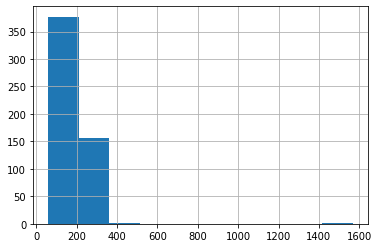

In [71]:
df['middle_coffee_cup'].hist()
plt.show()

Сделаем гистограмму более наглядной, исключив значения больше 350 рублей

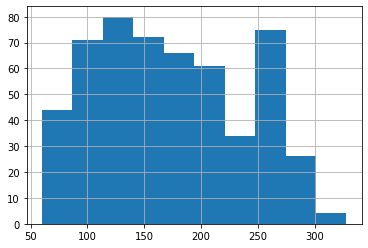

In [72]:
df['middle_coffee_cup'][df['middle_coffee_cup'] <= 350].hist()
plt.show()

Также посмотрим на стоимость чашки капучино по районам (для сетевых и несетевых кофеен)

In [73]:
# стоимость чашки кофе для сетевых кофеен
is_chain.pivot_table(
        index='district', 
        values='middle_coffee_cup', 
        aggfunc='mean'
    ).sort_values(
        by='middle_coffee_cup', 
        ascending=False
    ).rename_axis(
        None, 
        axis=1
    ).reset_index()

,district,middle_coffee_cup
0,Восточный административный округ,234.000
1,Западный административный округ,187.000
2,Юго-Западный административный округ,180.053
3,Центральный административный округ,175.734
4,Северо-Восточный административный округ,165.353
5,Северо-Западный административный округ,161.154
6,Северный административный округ,153.853
7,Юго-Восточный административный округ,149.077
8,Южный административный округ,141.857


Также изучим стоимость для несетевых заведений

In [74]:
# стоимость чашки кофе для не сетевых кофеен
df[df['chain'] == 0].pivot_table(
        index='district', 
        values='middle_coffee_cup', 
        aggfunc='mean'
    ).sort_values(
        by='middle_coffee_cup', 
        ascending=False
    ).rename_axis(
        None, 
        axis=1
    ).reset_index()

,district,middle_coffee_cup
0,Центральный административный округ,199.540
1,Западный административный округ,195.250
2,Юго-Западный административный округ,187.562
3,Северный административный округ,173.977
4,Южный административный округ,171.240
5,Северо-Восточный административный округ,165.308
6,Северо-Западный административный округ,159.636
7,Юго-Восточный административный округ,151.773
8,Восточный административный округ,137.115


Визуализируем стоимость чашки кофе по районам

In [75]:
district_cup = df.groupby(['district'])['middle_coffee_cup'].median().sort_values(ascending=False)
district_cup

district
Юго-Западный административный округ       197.000
Центральный административный округ        190.000
Западный административный округ           187.000
Северо-Восточный административный округ   162.500
Северный административный округ           159.000
Северо-Западный административный округ    150.000
Южный административный округ              149.500
Юго-Восточный административный округ      145.000
Восточный административный округ          135.000
Name: middle_coffee_cup, dtype: float64

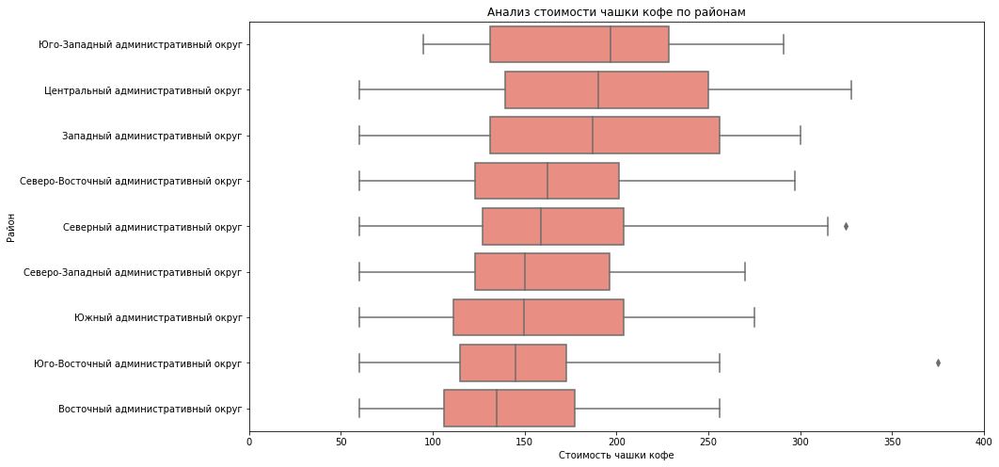

In [76]:
f, ax = plt.subplots(figsize = (14, 8))
ax = sns.boxplot(y = df['district'], x = 'middle_coffee_cup', \
                 data = df,
                 order = district_cup.index,
                 color = 'salmon'
                )
plt.title('Анализ стоимости чашки кофе по районам')

ax.set_xlabel('Стоимость чашки кофе')
ax.set_ylabel('Район')
ax.set_xlim(0,400)

plt.show()

Изучив среднюю стоимости чашки капучино в кофейнях, можно сделать вывод, что при расчете стоимости одной чашки кофе стоит ориентироваться на то, в каком районе будет открыта кофейня. Если для центрального района Москвы средняя стоимость составляет 199 рублей, то для других административных округов, стоимости чашки кофе будет ниже.

## Вывод

В этом блоке мы изучили особенности кофеен Москвы и подготовили рекомендации по открытию новой кофейни.

По данным из датасета, в Москве расположено 1413 кофеен

В датасете есть круглосуточные кофейни, но их очень мало, всего 59 заведений. 
Я не рекомендую открывать круглосуточную кофейню

ТОП - 3 района по рейтингу кофеен:

- Центральный административный округ - 4.336
- Северо-Западный административный округ - 4.326
- Северный административный округ - 4.292

Анализируя количество посадочных мест, предлагаю остановить выбор на 70 - 80

Если говорить о районах Москвы, то лучше открыть кофейню в Центральном административном округе.

Этот выбор можно объяснить тем, что там уже присутствует множество кофеен и ресторанов, следовательно, там есть аудитория, заинтересованная в таких заведениях.

При расчете стоимости чашке кофе, важно понимать, в каком районе будет открыта кофейня, в зависимости от района, средняя стоимость чашки кофе меняется. 
Также стоимость зависит и от того, сетевое заведение или нет. В не сетевых кофейнях кофе стоит дешевле, также наблюдается меньшая разница между стоимостью кофе в разных районах.

Я рекомендую ориентироваться на среднюю стоимость чашки кофе в районе при открытии кофейни.

## Шаг 5. Подготовка презентации

Презентация доступна по ссылке: https://drive.google.com/file/d/1OYin7mEQGB97mZy6zHqMcWDqnOcGm9g0/view?usp=share_link